**Import necessary packages**

In [1]:
# Importing libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pybedtools import BedTool
import pickle
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec
%cd /ceph/hpc/home/novljanj/data_storage/projects/LIN28A_associated/results/Trying_CNNs

/ceph/hpc/data/ki-erc/jnovljan/projects/LIN28A_associated/results/Trying_CNNs


*All figure generating cells are self-contained and read all the data needed to plot.

**Drawing the heatmap visualisation of LIN28A relocalisation in context of PABPC positioning**

In [20]:
# Import the combined clip data
DOX_C1_clip_data = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'DOX_C1_Crick_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
DOX_C1_GFP_LIN28A_clip_data = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'PABPC1_ESC_DKO_doxGFPLin28A_grouped_cdna_mm39.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
DOX_C4_clip_data = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'DOX_C4_Proteintech_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
KO_C1_clip_data = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'KO_C1_Crick_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
KO_C4_clip_data = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'KO_C4_Proteintech_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
LIN28A_LIF_clip_data = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'LIN28A-WT_ESC_LIF-CHIR_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
LIN28A_iLIF_clip_data = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'LIN28A-WT_ESCiLIF_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])

# Import the transcripts
dataset_subset = pd.read_table(r'dataset_subset_95.bed', header=None, names= ['chromosome', 'start', 'end', 'classification', 'log2fold', 'strand', 'gene_name', 'sequence'])

In [11]:
DOX_C1_clip_data

,chromosome,start,end,name,score,strand
0,chr1,3053019,3053020,.,1,-
1,chr1,3053998,3053999,.,1,-
2,chr1,3062699,3062700,.,1,+
3,chr1,3063845,3063846,.,1,+
4,chr1,3063884,3063885,.,1,-
...,...,...,...,...,...,...
13303126,MU069435.1,31085,31086,.,2,+
13303127,MU069435.1,31087,31088,.,1,+
13303128,MU069435.1,31092,31093,.,1,+
13303129,MU069435.1,31100,31101,.,1,-


In [ ]:
# Create zero-filled dataframe of max_length for each gene
def create_padded_df(df, max_length):
    gene_names = df['gene_name'].unique()
    padded_df = pd.DataFrame(np.nan, index=gene_names, columns=range(max_length))
    return padded_df

def process_data(df, max_length):
    df = df.reindex(columns=["chromosome", "start", "end", "strand", "name", "score"])

    # Create bedtools objects
    bed_data = BedTool.from_dataframe(df[['chromosome', 'start', 'end', 'name', 'score', 'strand']])

    # Find overlaps considering strand specificity
    overlap = utr_bed.intersect(bed_data, wo=True, s=True)

    # Convert back to dataframes
    overlap_df = overlap.to_dataframe(names= ['gene_chromosome', 'gene_start', 'gene_end', 'gene_name', 'log2fold', 'gene_strand', 'clip_chromosome', 'clip_start', 'clip_end', 'clip_name', 'score', 'strand', "idk"])
    
    # Pad sequences
    padded_df = create_padded_df(utr, max_length)

    # Populate padded dataframe with zeros in the range of each gene's length
    for _, row in utr.iterrows():
        gene_name = row['gene_name']
        gene_start = row['start']
        gene_end = row['end']
        gene_length = gene_end - gene_start
        padded_df.loc[gene_name, :gene_length] = 0

    # Populate padded dataframe with scores
    for index, row in overlap_df.iterrows():
        gene_name = row['gene_name']
        gene_start = row['gene_start']
        gene_end = row['gene_end']
        clip_start = row['clip_start']
        clip_end = row['clip_end']
        score = row['score']
        if row['strand'] == "-":
            padded_df.loc[gene_name, gene_end - clip_end] = score
        else:
            padded_df.loc[gene_name, clip_start - gene_start] = score

    # Propagate terminal sequence positions to padded dataframes
    for gene_name, term_seq_pos in dataset_subset[['gene_name', 'term_seq_pos']].values:
        if gene_name in padded_df.index:
            padded_df.loc[gene_name, 'term_seq_pos'] = term_seq_pos

    term_seq_pos_list = [padded_df.loc[gene_name, 'term_seq_pos'] for gene_name in padded_df.index]
    
    return padded_df, term_seq_pos_list, overlap_df

clip_data_dict = {
    'LIN28A_LIF_clip_data': LIN28A_LIF_clip_data, 
    'LIN28A_iLIF_clip_data': LIN28A_iLIF_clip_data,
    'DOX_C4_clip_data': DOX_C4_clip_data,
    'KO_C4_clip_data': KO_C4_clip_data, 
    'DOX_C1_clip_data': DOX_C1_clip_data, 
    'KO_C1_clip_data': KO_C1_clip_data, 
    'DOX_C1_GFP_LIN28A_clip_data': DOX_C1_GFP_LIN28A_clip_data
}

max_length = max(dataset_subset['end'] - dataset_subset['start'])
utr = dataset_subset[dataset_subset["classification"]=="DOWN"][['chromosome', 'start', 'end', 'gene_name', 'log2fold', 'strand']]
utr_bed = BedTool.from_dataframe(utr)

# Add terminal sequence column to dataset_subset
term_seq = 'AATAAA'
dataset_subset['term_seq_pos'] = dataset_subset['sequence'].str.rfind(term_seq)
dataset_subset['term_seq_pos'] = dataset_subset['term_seq_pos'].apply(lambda pos: np.nan if pos == -1 else pos)

# Store processed data in a dictionary
processed_data_dict = {}
for name, data in clip_data_dict.items():
    processed_data_dict[name] = process_data(data, max_length)

In [ ]:
for key, (df, lst, series) in processed_data_dict.items():
    # Check if 'term_seq_pos' column exists in the DataFrame
    if 'term_seq_pos' in df.columns:
        # Drop the 'term_seq_pos' column from the DataFrame
        df = df.drop(columns=['term_seq_pos'])
    # Update the dictionary with the modified DataFrame
    processed_data_dict[key] = (df, lst, series)

def merge_data_with_prefix(data_dict, list_column_name, series_column_name):

    df_list = []

    for key, (df, lst, series) in data_dict.items():
        # Prefix the DataFrame's column names with the key
        df.columns = [f"{key}_{col}" for col in df.columns]

        # Convert the list and Series to DataFrames with specified column names
        list_df = pd.DataFrame({f"{key}_{list_column_name}": lst}, index=df.index)
        series_df = pd.DataFrame({f"{key}_{series_column_name}": series}, index=df.index)
        
        # Concatenate the modified DataFrame, list DataFrame, and Series DataFrame horizontally
        combined_df = pd.concat([df, list_df, series_df], axis=1)
        
        # Append the combined DataFrame to the list
        df_list.append(combined_df)

    # Concatenate all combined DataFrames into one big DataFrame vertically
    big_df = pd.concat(df_list, axis=1)

    return big_df

# Merge the data with the prefix
processed_data_df = merge_data_with_prefix(processed_data_dict, 'Terminal_AATAAA_Position', 'Summed_and_Normalized_CLIP_Score')

In [15]:
#  Smooth the data with simple moving average
window_size = 10
smoothed_data_dict = {}

for key, data in processed_data_dict.items():
    df = data[0]  # accessing the DataFrame
    last_col = df.iloc[:, -1]  # saving the last column
    df_without_last = df.iloc[:, :-1]  # all but the last column

    #df_without_last.replace(np.nan, 0, inplace=True)
    smoothed_df = df_without_last.rolling(window=window_size, min_periods=10, axis=1).mean()
    smoothed_df.iloc[:, :9] = 0
               
    # Remove NaNs and create list of scores for each row
    score_lists = smoothed_df.apply(lambda row: list(row.dropna()), axis=1)

    # Normalise each score by the sum and min max
    normalized_lists = score_lists.apply(lambda x: [(i - min(x)) / (max(x) - min(x)) if sum(x) != 0 else i for i in x])

    # Create a dataframe with only nan values with number of columns matching the length of the longest list
    max_length = len(df_without_last.columns)
    nan_df = pd.DataFrame(np.nan, index=df.index, columns=range(max_length))

    # Now fill the dataframe with the values from the lists
    for idx, row in nan_df.iterrows():
        nan_df.loc[idx, :len(normalized_lists.loc[idx])-1] = normalized_lists.loc[idx]
    
    summed_clip = df_without_last.sum(axis=1)

    lengths= df_without_last.iloc[:, ::-1].notna().idxmax(axis=1)    

    summed_and_norm_clip = summed_clip / (lengths/1000)

    nan_df[last_col.name] = last_col  # adding the last column back
    smoothed_data_dict[key] = (nan_df, data[1], summed_and_norm_clip)  # replace first element and keep the second
    
for key, (df, lst, series) in smoothed_data_dict.items():
    # Check if 'term_seq_pos' column exists in the DataFrame
    if 'term_seq_pos' in df.columns:
        # Drop the 'term_seq_pos' column from the DataFrame
        df = df.drop(columns=['term_seq_pos'])
    # Update the dictionary with the modified DataFrame
    smoothed_data_dict[key] = (df, lst, series)

def merge_data_with_prefix(data_dict, list_column_name, series_column_name):

    df_list = []

    for key, (df, lst, series) in data_dict.items():
        # Prefix the DataFrame's column names with the key
        df.columns = [f"{key}_{col}" for col in df.columns]

        # Convert the list and Series to DataFrames with specified column names
        list_df = pd.DataFrame({f"{key}_{list_column_name}": lst}, index=df.index)
        series_df = pd.DataFrame({f"{key}_{series_column_name}": series}, index=df.index)
        
        # Concatenate the modified DataFrame, list DataFrame, and Series DataFrame horizontally
        combined_df = pd.concat([df, list_df, series_df], axis=1)
        
        # Append the combined DataFrame to the list
        df_list.append(combined_df)

    # Concatenate all combined DataFrames into one big DataFrame vertically
    big_df = pd.concat(df_list, axis=1)

    return big_df

# Merge the data with the prefix
smoothed_data_df = merge_data_with_prefix(smoothed_data_dict, 'Terminal_AATAAA_Position', 'Summed_and_Normalized_CLIP_Score')
smoothed_data_df.to_csv('analysis14_CLIPHeatmapAndMetaplot/smoothed_data_df.csv')

In [ ]:
# Create data for the expresion normalised clip data per gene

quantseq_counts = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', '3’ UTRs of genes in bed file format', 'mean_gene-level_TPMs_suplementary.csv'))
quantseq_counts_down = pd.merge(utr, quantseq_counts, left_on='gene_name', right_on='geneID', how='left')
quantseq_counts_subset = quantseq_counts_down[['geneID', 'S200WT_FCL', 'S200WT_2iL', 'S200WT_FCL', 'KO_FCL', 'S200WT_FCL', 'KO_FCL']]
quantseq_counts_subset = quantseq_counts_subset.set_index('geneID',)
quantseq_counts_subset.index.name = None

normalised_clip_data_dict = {
    'LIN28A_LIF_clip_data_down_normalised': smoothed_data_dict['LIN28A_LIF_clip_data'][2] / (LIN28A_LIF_clip_data['score'].sum() / 1e6),
    'LIN28A_iLIF_clip_data_down_normalised': smoothed_data_dict['LIN28A_iLIF_clip_data'][2] / (LIN28A_iLIF_clip_data['score'].sum() / 1e6),
    'DOX_C4_clip_data_down_normalised': smoothed_data_dict['DOX_C4_clip_data'][2] / (DOX_C1_clip_data['score'].sum() / 1e6),
    'KO_C4_clip_data_down_normalised': smoothed_data_dict['KO_C4_clip_data'][2] / (KO_C1_clip_data['score'].sum() / 1e6),
    'DOX_C1_clip_data_down_normalised': smoothed_data_dict['DOX_C1_clip_data'][2] / (DOX_C1_clip_data['score'].sum() / 1e6),
    'KO_C1_clip_data_down_normalised': smoothed_data_dict['KO_C1_clip_data'][2] / (KO_C1_clip_data['score'].sum() / 1e6)
}

normalised_clip_data_df = pd.DataFrame.from_dict(normalised_clip_data_dict)

# Create a dictionary to hold the resulting dataframes
expression_data_dict = {}

# Iterate over the items in normalised_clip_data_dict
for i, (key, df) in enumerate(normalised_clip_data_dict.items()):
    # Extract corresponding column from quantseq_counts_subset and rename it
    quantseq_col = quantseq_counts_subset.iloc[:, i].rename(quantseq_counts_subset.columns[i])
    normalised_clip_column = df.rename(key)
    # Create a new dataframe by concatenating the current dataframe with the corresponding column from quantseq_counts_subset
    new_df = pd.concat([normalised_clip_column, quantseq_col], axis=1)

    # Add the new dataframe to the dictionary
    expression_data_dict[i] = new_df

# Concatenate all DataFrames in the dictionary along columns
expression_data_df = pd.concat(expression_data_dict.values(), axis=1)

expression_data_df.to_csv('analysis14_CLIPHeatmapAndMetaplot/expression_data_df.csv')

In [2]:
expression_data_df = pd.read_csv('analysis14_CLIPHeatmapAndMetaplot/expression_data_df.csv', index_col=0)
expression_data_df

,LIN28A_LIF_clip_data_down_normalised,S200WT_FCL,LIN28A_iLIF_clip_data_down_normalised,S200WT_2iL,DOX_C4_clip_data_down_normalised,S200WT_FCL.1,KO_C4_clip_data_down_normalised,KO_FCL,DOX_C1_clip_data_down_normalised,S200WT_FCL.2,KO_C1_clip_data_down_normalised,KO_FCL.1
ENSMUSG00000011267,0.000000,26.041584,1.590175,20.544427,1.908616,26.041584,9.436122,56.071516,7.634466,26.041584,47.879583,56.071516
ENSMUSG00000006058,11.908779,82.041514,3.148862,96.254836,10.393456,82.041514,7.266541,131.899029,16.692520,82.041514,20.415519,131.899029
ENSMUSG00000071528,75.468970,375.074216,10.912969,815.629823,5.925443,375.074216,6.852667,1020.516689,51.769662,375.074216,40.773367,1020.516689
ENSMUSG00000027752,56.052196,117.172725,13.380117,290.535307,44.781454,117.172725,35.966521,226.397493,136.506226,117.172725,146.241232,226.397493
ENSMUSG00000040269,14.013049,1.053519,7.719298,31.239442,58.987984,1.053519,39.359589,51.355322,72.576840,1.053519,75.326110,51.355322
...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000039826,12.421079,7.321705,16.907456,11.867382,2.099303,7.321705,2.018114,15.738022,11.497572,7.321705,9.983789,15.738022
ENSMUSG00000092035,20.755405,4.762603,15.174540,1.002780,39.733748,4.762603,58.634802,8.858280,85.868344,4.762603,136.065131,8.858280
ENSMUSG00000039542,12.572937,5.577195,41.732096,14.711683,6.611924,5.577195,8.108920,10.019708,39.008430,5.577195,65.515428,10.019708
ENSMUSG00000019942,4.445471,27.268542,3.823373,28.378913,7.689458,27.268542,4.083413,23.983156,34.910709,27.268542,26.917193,23.983156


In [7]:
smoothed_data_df = pd.read_csv('analysis14_CLIPHeatmapAndMetaplot/smoothed_data_df.csv', index_col=0)
smoothed_data_df

,LIN28A_LIF_clip_data_0,LIN28A_LIF_clip_data_1,LIN28A_LIF_clip_data_2,LIN28A_LIF_clip_data_3,LIN28A_LIF_clip_data_4,LIN28A_LIF_clip_data_5,LIN28A_LIF_clip_data_6,LIN28A_LIF_clip_data_7,LIN28A_LIF_clip_data_8,LIN28A_LIF_clip_data_9,...,DOX_C1_GFP_LIN28A_clip_data_3417,DOX_C1_GFP_LIN28A_clip_data_3418,DOX_C1_GFP_LIN28A_clip_data_3419,DOX_C1_GFP_LIN28A_clip_data_3420,DOX_C1_GFP_LIN28A_clip_data_3421,DOX_C1_GFP_LIN28A_clip_data_3422,DOX_C1_GFP_LIN28A_clip_data_3423,DOX_C1_GFP_LIN28A_clip_data_3424,DOX_C1_GFP_LIN28A_clip_data_Terminal_AATAAA_Position,DOX_C1_GFP_LIN28A_clip_data_Summed_and_Normalized_CLIP_Score
ENSMUSG00000011267,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,120.000000
ENSMUSG00000006058,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.333333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.0,69.306931
ENSMUSG00000071528,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.0,58.823529
ENSMUSG00000027752,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.100000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.0,815.533981
ENSMUSG00000040269,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.333333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79.0,951.456311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000039826,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.581118
ENSMUSG00000092035,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3254.0,213.414634
ENSMUSG00000039542,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3283.0,376.132931
ENSMUSG00000019942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3327.0,129.061103


In [2]:
def reverse_df_to_dict(expression_data_df):
    # Initialize an empty dictionary to store the split DataFrames
    expression_data_dict = {}

    # Use a step of 2 in range to iterate over columns in pairs
    for i in range(0, len(expression_data_df.columns), 2):
        # The dictionary key is based on the iteration
        key = i // 2
        # Select the pair of columns for this iteration
        expression_data_dict[key] = expression_data_df.iloc[:, i:i+2]
    return expression_data_dict

def reverse_merge_data_with_prefix(big_df, list_column_name, series_column_name):

    reversed_dict = {}

    # Processing each column to allocate it correctly
    for col in big_df.columns:
        # Identifying if the column is a list or series column
        if list_column_name in col:
            # Extract the key by removing the full list_column_name and underscore
            key = col.replace(f"_{list_column_name}", "")
            if key not in reversed_dict:
                reversed_dict[key] = [pd.DataFrame(), [], pd.Series()]
            # Extract and assign the list
            reversed_dict[key][1] = big_df[col].tolist()
        elif series_column_name in col:
            # Extract the key by removing the full series_column_name and underscore
            key = col.replace(f"_{series_column_name}", "")
            if key not in reversed_dict:
                reversed_dict[key] = [pd.DataFrame(), [], pd.Series()]
            # Extract and assign the series, removing the name
            reversed_dict[key][2] = big_df[col].rename(None)
        else:
            # Handling original DataFrame columns
            key, orig_col_name = col.rsplit('_', 1)
            if key not in reversed_dict:
                reversed_dict[key] = [pd.DataFrame(), [], pd.Series()]
            
            # Assigning the column to the DataFrame part of the tuple
            reversed_dict[key][0][orig_col_name] = big_df[col]

    # Converting lists back to tuples for each key
    for key in reversed_dict:
        df, lst, series = reversed_dict[key]
        reversed_dict[key] = (df, lst, series)

    return reversed_dict

smoothed_data_df = pd.read_csv('analysis14_CLIPHeatmapAndMetaplot/smoothed_data_df.csv', index_col=0)
smoothed_data_dict = reverse_merge_data_with_prefix(smoothed_data_df, 'Terminal_AATAAA_Position', 'Summed_and_Normalized_CLIP_Score')

expression_data_df = pd.read_csv('analysis14_CLIPHeatmapAndMetaplot/expression_data_df.csv', index_col=0)
expression_data_dict = reverse_df_to_dict(expression_data_df)

draw_sequence_index_start = 600
draw_sequence_index_end = 800
max_length = 1200

gs = gridspec.GridSpec(6, 40)
# Create an extra subplot for each row
fig, axes = plt.subplots(len(smoothed_data_dict), 4, figsize=(20, 15), dpi=600, sharey=True)
axes = axes.ravel()  # flatten axes
cbar_ax = fig.add_axes([1, 0.04, .03, 0.936])  # position of the colorbar

custom_titles = ["LIN28A-LIF CLIP-seq peaks", "LIN28A-iLIF CLIP-seq peaks", "PABPC4-DOX CLIP-seq peaks", "PABPC4-KO CLIP-seq peaks", "PABPC1-DOX CLIP-seq peaks", "PABPC1-KO CLIP-seq peaks"]

for i, (name, data) in enumerate(smoothed_data_dict.items()):
    if i >= 6:
        break
    print(i)
    print(name)
    padded_df, term_seq_pos_list, summed_and_norm_clip = data
    
    padded_df = padded_df.iloc[draw_sequence_index_start:draw_sequence_index_end, :max_length]
    
    term_seq_pos_list = term_seq_pos_list[draw_sequence_index_start:draw_sequence_index_end]
    padded_df_copy = padded_df.iloc[:, :].copy()

    indices = (padded_df_copy.iloc[:, ::-1].notna().idxmax(axis=1).astype(int)-200).tolist()
    
    # Smooth the indices
    indices_series = pd.Series(indices)

    # Now you can apply the rolling function
    indices_rolling_avg = indices_series.rolling(window=10, min_periods=1, center=True).mean()

    # Convert the smoothed series back to a list if needed
    indices_smoothed = indices_rolling_avg.tolist()

    # Invert the order of rows
    padded_df_copy = padded_df_copy[::-1]
    term_seq_pos_list = term_seq_pos_list[::-1]
    indices_smoothed = indices_smoothed[::-1]

    padded_df_copy.index = range(1, len(padded_df_copy) + 1)  # change index to sequence numbers starting from 1
    normalised_with_expression = pd.DataFrame()
    
    # Draw heatmaps from Code 1 on the left of each heatmap from Code 2
    normalised_with_expression["score"] = expression_data_dict[i].iloc[:, 0] / expression_data_dict[i].iloc[:, 1]

    
    # Third heatmap from Code 1
    ax1 = plt.subplot(gs[i, 0:1])  # we use the second "column" for the second smaller heatmap
    sns.heatmap(normalised_with_expression.iloc[:, [0]].iloc[draw_sequence_index_start:draw_sequence_index_end], cmap="YlOrRd", ax=ax1, norm=colors.LogNorm(vmin=1e-2, vmax=1e2))
    ax1.set_title('Sum of Library Size, Length \n and Expresion Normalised \n Transcript CLIP Counts', fontsize=6)
    ax1.set_yticklabels([])  # remove the y-tick labels
    ax1.set_xticklabels([])
    ax1.set_xticks([])
    ax1.spines['bottom'].set_visible(False)

    # First heatmap from Code 1
    ax2 = plt.subplot(gs[i, 5:6])  # we use the first "column" for the first smaller heatmap
    sns.heatmap(expression_data_dict[i].iloc[:, [0]].iloc[draw_sequence_index_start:draw_sequence_index_end], cmap="YlGnBu", ax=ax2, norm=colors.LogNorm(vmin=1e-1, vmax=1e4))
    ax2.set_title('Sum of Length and Library Size Normalised \n Transcript CLIP Counts', fontsize=6)
    ax2.set_yticklabels([])  # remove the y-tick labels
    ax2.set_xticklabels([])
    ax2.set_xticks([])
    ax2.spines['bottom'].set_visible(False)

    # Second heatmap from Code 1
    ax3 = plt.subplot(gs[i, 10:11])  # we use the second "column" for the second smaller heatmap
    sns.heatmap(expression_data_dict[i].iloc[:, [1]].iloc[draw_sequence_index_start:draw_sequence_index_end], cmap="YlOrRd", ax=ax3, norm=colors.LogNorm(vmin=1e0, vmax=1e3))
    ax3.set_title('Mean of Normalised \n Transcript QuantSeq Counts', fontsize=6)
    ax3.set_yticklabels([])  # remove the y-tick labels
    ax3.set_xticklabels([])
    ax3.set_xticks([])
    ax3.spines['bottom'].set_visible(False)


    # Draw heatmaps on the i-th subplot
    ax = plt.subplot(gs[i, 16:])  # we use the remaining "columns" for the large heatmap
    im = ax.imshow(padded_df_copy, cmap='Blues', vmax=0.3, aspect='auto')

    # Draw terminal sequence positions
    scatter_plot = ax.scatter(term_seq_pos_list, range(1, len(term_seq_pos_list) + 1), c='green', s=1, label='PolyA Signal')
    line_plot = ax.plot(indices_smoothed, range(1, len(indices_smoothed) + 1), 'k--', label='-200bp of the Transcript End')

    # Set x-axis and y-axis ticks and labels
    ax.set_xticks(np.arange(0, max_length + 1, step=100))
    ax.set_yticks(np.arange(0,len(padded_df_copy)+1,  step=50))
    ax.set_yticklabels(np.arange(0,len(padded_df_copy)+1,  step=50))
    ax.set_ylim(0, len(padded_df_copy)) 

    # Set the x labels to be empty for all but the last plot
    if i < 5:  # replace 3 with the number of plots - 1
        ax.set_xticks([])
        ax.set_xticklabels([])
        ax.spines['bottom'].set_visible(False)
    else:
        ax.set_xticklabels(np.arange(0, max_length + 1, step=100))
        ax.set_xlabel('3\'UTR sequence', fontsize=15)
        
    ax.set_ylabel('Transcripts', fontsize=13)  # Add y label

    ax.set_title(custom_titles[i], fontsize=13)  # Add title
    
    # Remove top and right borders
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    if i == 0:  # if this is the first graph
        legend1 = ax.legend(handles=[scatter_plot, line_plot[0]], loc='upper right', frameon=False)
        # Change the size of legend markers
        legend1.legendHandles[0]._sizes = [25]  # set the marker size as per your preference

# Common colorbar for all subplots
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.outline.set_visible(False)  # remove colorbar border

plt.subplots_adjust(wspace=0.2, hspace=0.4)

plt.show()

/tmp/ipykernel_284742/1006637252.py:38: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  reversed_dict[key] = [pd.DataFrame(), [], pd.Series()]
/tmp/ipykernel_284742/1006637252.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  reversed_dict[key][0][orig_col_name] = big_df[col]
/tmp/ipykernel_284742/1006637252.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  reversed_dict[key][0][orig_col_name] = big_df[col]
/t

0
LIN28A_LIF_clip_data


/tmp/ipykernel_284742/1006637252.py:104: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(gs[i, 0:1])  # we use the second "column" for the second smaller heatmap
/tmp/ipykernel_284742/1006637252.py:122: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax3 = plt.subplot(gs[i, 10:11])  # we use the second "column" for the second smaller heatmap
/tmp/ipykernel_284742/1006637252.py:132: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(gs[i, 16:])  # we use the remaining "columns" for the large heatmap
/tmp/ipykernel_284742/1006637252.py:165: MatplotlibDeprecationWarning: The legendHandl

1
LIN28A_iLIF_clip_data


/tmp/ipykernel_284742/1006637252.py:122: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax3 = plt.subplot(gs[i, 10:11])  # we use the second "column" for the second smaller heatmap
/tmp/ipykernel_284742/1006637252.py:132: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(gs[i, 16:])  # we use the remaining "columns" for the large heatmap
/tmp/ipykernel_284742/1006637252.py:104: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(gs[i, 0:1])  # we use the second "column" for the second smaller heatmap


2
DOX_C4_clip_data


/tmp/ipykernel_284742/1006637252.py:122: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax3 = plt.subplot(gs[i, 10:11])  # we use the second "column" for the second smaller heatmap
/tmp/ipykernel_284742/1006637252.py:132: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(gs[i, 16:])  # we use the remaining "columns" for the large heatmap
/tmp/ipykernel_284742/1006637252.py:104: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(gs[i, 0:1])  # we use the second "column" for the second smaller heatmap


3
KO_C4_clip_data


/tmp/ipykernel_284742/1006637252.py:122: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax3 = plt.subplot(gs[i, 10:11])  # we use the second "column" for the second smaller heatmap
/tmp/ipykernel_284742/1006637252.py:132: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(gs[i, 16:])  # we use the remaining "columns" for the large heatmap


4
DOX_C1_clip_data


/tmp/ipykernel_284742/1006637252.py:104: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(gs[i, 0:1])  # we use the second "column" for the second smaller heatmap
/tmp/ipykernel_284742/1006637252.py:122: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax3 = plt.subplot(gs[i, 10:11])  # we use the second "column" for the second smaller heatmap
/tmp/ipykernel_284742/1006637252.py:132: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(gs[i, 16:])  # we use the remaining "columns" for the large heatmap
/tmp/ipykernel_284742/1006637252.py:104: MatplotlibDeprecationWarning: Auto-removal of

5
KO_C1_clip_data


/tmp/ipykernel_284742/1006637252.py:122: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax3 = plt.subplot(gs[i, 10:11])  # we use the second "column" for the second smaller heatmap
/tmp/ipykernel_284742/1006637252.py:132: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(gs[i, 16:])  # we use the remaining "columns" for the large heatmap


In [3]:
padded_df, term_seq_pos_list, summed_and_norm_clip = smoothed_data_dict["LIN28A_LIF_clip_data"]
# find the column where the first nan value is
print(padded_df.iloc[600].isnull().idxmax())
print(padded_df.iloc[800].isnull().idxmax())

754
1168


**Drawing the heatmap visualisation of LIN28A iLIF and LIF, and PABPC1 iLIF**

In [41]:
# Import the combined clip data
LIN28A_LIF_clip_data = pd.read_csv("../../data/Merged_crosslinks/LIN28A-WT_ESC_LIF-CHIR_merged.bed", sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
LIN28A_iLIF_clip_data = pd.read_csv("../../data/Merged_crosslinks/LIN28A-WT_ESCiLIF_merged.bed", sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
PABPC1_iLIF_clip_data = pd.read_csv("../../data/Pabpc1Crosslinks/PABPC1_ESC_WT_grouped_cdna_mm39.bed", sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])


# Import the transcripts
dataset_subset = pd.read_table(r'dataset_subset_95.bed', header=None, names= ['chromosome', 'start', 'end', 'classification', 'log2fold', 'strand', 'gene_name', 'sequence'])

In [ ]:
# Create zero-filled dataframe of max_length for each gene
def create_padded_df(df, max_length):
    gene_names = df['gene_name'].unique()
    padded_df = pd.DataFrame(np.nan, index=gene_names, columns=range(max_length))
    return padded_df

def process_data(df, max_length):
    df = df.reindex(columns=["chromosome", "start", "end", "strand", "name", "score"])

    # Create bedtools objects
    bed_data = BedTool.from_dataframe(df[['chromosome', 'start', 'end', 'name', 'score', 'strand']])

    # Find overlaps considering strand specificity
    overlap = utr_bed.intersect(bed_data, wo=True, s=True)

    # Convert back to dataframes
    overlap_df = overlap.to_dataframe(names= ['gene_chromosome', 'gene_start', 'gene_end', 'gene_name', 'log2fold', 'gene_strand', 'clip_chromosome', 'clip_start', 'clip_end', 'clip_name', 'score', 'strand', "idk"])
    
    # Pad sequences
    padded_df = create_padded_df(utr, max_length)

    # Populate padded dataframe with zeros in the range of each gene's length
    for _, row in utr.iterrows():
        gene_name = row['gene_name']
        gene_start = row['start']
        gene_end = row['end']
        gene_length = gene_end - gene_start
        padded_df.loc[gene_name, :gene_length] = 0

    # Populate padded dataframe with scores
    for index, row in overlap_df.iterrows():
        gene_name = row['gene_name']
        gene_start = row['gene_start']
        gene_end = row['gene_end']
        clip_start = row['clip_start']
        clip_end = row['clip_end']
        score = row['score']
        if row['strand'] == "-":
            padded_df.loc[gene_name, gene_end - clip_end] = score
        else:
            padded_df.loc[gene_name, clip_start - gene_start] = score

    # Propagate terminal sequence positions to padded dataframes
    for gene_name, term_seq_pos in dataset_subset[['gene_name', 'term_seq_pos']].values:
        if gene_name in padded_df.index:
            padded_df.loc[gene_name, 'term_seq_pos'] = term_seq_pos

    term_seq_pos_list = [padded_df.loc[gene_name, 'term_seq_pos'] for gene_name in padded_df.index]
    
    return padded_df, term_seq_pos_list, overlap_df

clip_data_dict = {
    'LIN28A_LIF_clip_data': LIN28A_LIF_clip_data, 
    'LIN28A_iLIF_clip_data': LIN28A_iLIF_clip_data,
    'PABPC1_iLIF_clip_data': PABPC1_iLIF_clip_data,
}

max_length = max(dataset_subset['end'] - dataset_subset['start'])
utr = dataset_subset[dataset_subset["classification"]=="DOWN"][['chromosome', 'start', 'end', 'gene_name', 'log2fold', 'strand']]
utr_bed = BedTool.from_dataframe(utr)

# Add terminal sequence column to dataset_subset
term_seq = 'AATAAA'
dataset_subset['term_seq_pos'] = dataset_subset['sequence'].str.rfind(term_seq)
dataset_subset['term_seq_pos'] = dataset_subset['term_seq_pos'].apply(lambda pos: np.nan if pos == -1 else pos)

# Store processed data in a dictionary
processed_data_dict = {}
for name, data in clip_data_dict.items():
    processed_data_dict[name] = process_data(data, max_length)

In [43]:
#  Smooth the data with simple moving average
window_size = 10
smoothed_data_dict = {}

for key, data in processed_data_dict.items():
    df = data[0]  # accessing the DataFrame
    last_col = df.iloc[:, -1]  # saving the last column
    df_without_last = df.iloc[:, :-1]  # all but the last column

    #df_without_last.replace(np.nan, 0, inplace=True)
    smoothed_df = df_without_last.rolling(window=window_size, min_periods=10, axis=1).mean()
    smoothed_df.iloc[:, :9] = 0
               
    # Remove NaNs and create list of scores for each row
    score_lists = smoothed_df.apply(lambda row: list(row.dropna()), axis=1)

    # Normalise each score by the sum and min max
    # normalized_lists = score_lists.apply(lambda x: [i / sum(x) if sum(x) != 0 else i for i in x])
    normalized_lists = score_lists.apply(lambda x: [(i - 0) / (max(x) - 0) if sum(x) != 0 else i for i in x])

    # Create a dataframe with only nan values with number of columns matching the length of the longest list
    max_length = len(df_without_last.columns)
    nan_df = pd.DataFrame(np.nan, index=df.index, columns=range(max_length))

    # Now fill the dataframe with the values from the lists
    for idx, row in nan_df.iterrows():
        nan_df.loc[idx, :len(normalized_lists.loc[idx])-1] = normalized_lists.loc[idx]
    
    #smoothed_df.replace(0, np.nan, inplace=True)
    summed_clip = df_without_last.sum(axis=1)

    lengths= df_without_last.iloc[:, ::-1].notna().idxmax(axis=1)    

    summed_and_norm_clip = summed_clip / (lengths/1000)

    nan_df[last_col.name] = last_col  # adding the last column back
    smoothed_data_dict[key] = (nan_df, data[1], summed_and_norm_clip)  # replace first element and keep the second
   
for key, (df, lst, series) in smoothed_data_dict.items():
    # Check if 'term_seq_pos' column exists in the DataFrame
    if 'term_seq_pos' in df.columns:
        # Drop the 'term_seq_pos' column from the DataFrame
        df = df.drop(columns=['term_seq_pos'])
    # Update the dictionary with the modified DataFrame
    smoothed_data_dict[key] = (df, lst, series)


def merge_data_with_prefix(data_dict, list_column_name, series_column_name):

    df_list = []

    for key, (df, lst, series) in data_dict.items():
        # Prefix the DataFrame's column names with the key
        df.columns = [f"{key}_{col}" for col in df.columns]

        # Convert the list and Series to DataFrames with specified column names
        list_df = pd.DataFrame({f"{key}_{list_column_name}": lst}, index=df.index)
        series_df = pd.DataFrame({f"{key}_{series_column_name}": series}, index=df.index)
        
        # Concatenate the modified DataFrame, list DataFrame, and Series DataFrame horizontally
        combined_df = pd.concat([df, list_df, series_df], axis=1)
        
        # Append the combined DataFrame to the list
        df_list.append(combined_df)

    # Concatenate all combined DataFrames into one big DataFrame vertically
    big_df = pd.concat(df_list, axis=1)

    return big_df

# Merge the data with the prefix
smoothed_data_df = merge_data_with_prefix(smoothed_data_dict, 'Terminal_AATAAA_Position', 'Summed_and_Normalized_CLIP_Score')
smoothed_data_df.to_csv('analysis14_CLIPHeatmapAndMetaplot/smoothed_data_df_subsetted.csv')

/tmp/ipykernel_281813/2883689913.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  reversed_dict[key] = [pd.DataFrame(), [], pd.Series()]
/tmp/ipykernel_281813/2883689913.py:29: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  reversed_dict[key][0][orig_col_name] = big_df[col]
/tmp/ipykernel_281813/2883689913.py:29: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  reversed_dict[key][0][orig_col_name] = big_df[col]
/t

LIN28A_LIF_clip_data
LIN28A_iLIF_clip_data
PABPC1_iLIF_clip_data


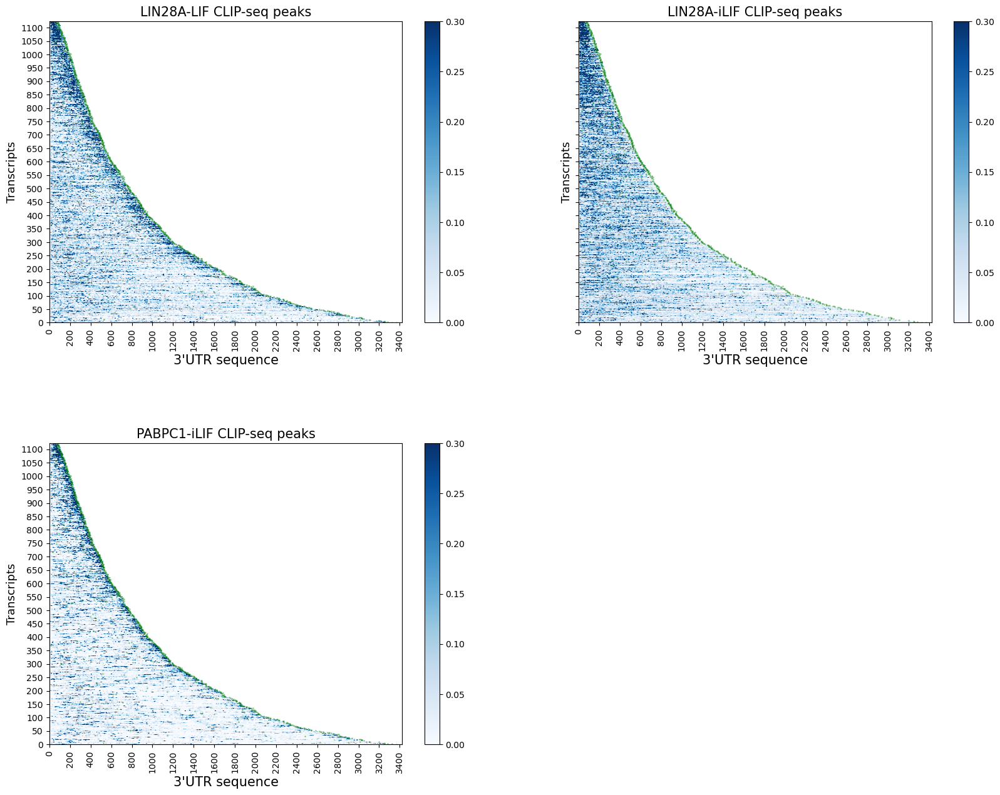

In [4]:
def reverse_merge_data_with_prefix(big_df, list_column_name, series_column_name):

    reversed_dict = {}

    # Processing each column to allocate it correctly
    for col in big_df.columns:
        # Identifying if the column is a list or series column
        if list_column_name in col:
            # Extract the key by removing the full list_column_name and underscore
            key = col.replace(f"_{list_column_name}", "")
            if key not in reversed_dict:
                reversed_dict[key] = [pd.DataFrame(), [], pd.Series()]
            # Extract and assign the list
            reversed_dict[key][1] = big_df[col].tolist()
        elif series_column_name in col:
            # Extract the key by removing the full series_column_name and underscore
            key = col.replace(f"_{series_column_name}", "")
            if key not in reversed_dict:
                reversed_dict[key] = [pd.DataFrame(), [], pd.Series()]
            # Extract and assign the series, removing the name
            reversed_dict[key][2] = big_df[col].rename(None)
        else:
            # Handling original DataFrame columns
            key, orig_col_name = col.rsplit('_', 1)
            if key not in reversed_dict:
                reversed_dict[key] = [pd.DataFrame(), [], pd.Series()]
            
            # Assigning the column to the DataFrame part of the tuple
            reversed_dict[key][0][orig_col_name] = big_df[col]

    # Converting lists back to tuples for each key
    for key in reversed_dict:
        df, lst, series = reversed_dict[key]
        reversed_dict[key] = (df, lst, series)

    return reversed_dict

smoothed_data_df = pd.read_csv('analysis14_CLIPHeatmapAndMetaplot/smoothed_data_df_subsetted.csv', index_col=0)
smoothed_data_dict = reverse_merge_data_with_prefix(smoothed_data_df, 'Terminal_AATAAA_Position', 'Summed_and_Normalized_CLIP_Score')

# Subset the dict to LIN28A_LIF_clip_data LIN28A_iLIF_clip_data PABPC1_iLIF_clip_data
smoothed_data_dict = {k: smoothed_data_dict[k] for k in ('LIN28A_LIF_clip_data', 'LIN28A_iLIF_clip_data', 'PABPC1_iLIF_clip_data')}

# Set the layout of the subplots as 2x2
fig, axes = plt.subplots(2, 2, figsize=(20, 15), sharey=True)
axes = axes.ravel()  # flatten axes

custom_titles = ["LIN28A-LIF CLIP-seq peaks", "LIN28A-iLIF CLIP-seq peaks", "PABPC1-iLIF CLIP-seq peaks"]

for i, (name, data) in enumerate(smoothed_data_dict.items()):

    print(name)
    padded_df, term_seq_pos_list, summed_and_norm_clip = data

    # Reverse the dataframes and lists
    padded_df = padded_df.iloc[::-1, :]
    term_seq_pos_list = term_seq_pos_list[::-1]

    padded_df.index = range(1, len(padded_df) + 1)

    ax = axes[i]
    im = ax.imshow(padded_df, cmap='Blues', vmax=0.3, aspect='auto')

    scatter_plot = ax.scatter(term_seq_pos_list, range(1, len(term_seq_pos_list) + 1), c='green', s=1, alpha=0.3, label='PolyA Signal')
    
    ax.set_xticks(np.arange(0, padded_df.shape[1] + 1, step=200))
    ax.set_yticks(np.arange(0, len(padded_df)+1,  step=50))
    ax.set_yticklabels(np.arange(0, len(padded_df)+1,  step=50))
    ax.set_ylim(0, len(padded_df)) 

    # Set the x labels and make them vertical
    ax.set_xticklabels(np.arange(0, padded_df.shape[1] + 1, step=200), rotation='vertical')
    ax.set_xlabel('3\'UTR sequence', fontsize=15)
    ax.set_title(custom_titles[i], fontsize=15)  # Set the title
    ax.set_ylabel('Transcripts', fontsize=13)  # Add y label

    # Adding the legend next to each graph
    fig.colorbar(im, ax=ax)
    
# Remove the last (empty) subplot if the number of plots is less than the total subplots
if len(smoothed_data_dict) < len(axes):
    for i in range(len(smoothed_data_dict), len(axes)):
        axes[i].remove()

plt.subplots_adjust(wspace=0.2, hspace=0.4)

# Export picture as svg
#plt.savefig('clip_data_heatmap_full_LIN28A_iLIF_LIF_and_PABPC1_iLIF_BLUE.svg', bbox_inches='tight')

plt.show()

**Metaprofile of crosslinking counts across multiple transcript regions - 5' UTR, CDS, and 3' UTR - in both UP+control and DOWN states**

In [47]:
# Reads a CSV file containing transcript names into a pandas DataFrame
transcipt_names = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', '3’ UTRs of genes in bed file format', 'ThreePrimeUtrsOfMostExpressedTxInS200WT2iL.bed'), sep='\t', header=None)

# Reads a CSV file into a pandas DataFrame. This DataFrame is named 'quantseq'
quantseq = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', '3’ UTRs of genes in bed file format', 'QuantseqGroups.bed'), sep='\t', header=None)

# Merges the two dataframes, 'transcipt_names' and 'quantseq', on common elements present in column 3 of the left DataFrame and column 6 of the right DataFrame.
merged = pd.merge(transcipt_names, quantseq, left_on=[3], right_on=[6], how='right')

# Selects certain columns from the merged dataframe
quantseq_with_transcript_names = merged[['0_y', '1_y', '2_y', '3_y', '4_y', '5_y', '6_y', 7]]

# Writes the 'quantseq_with_transcript_names' DataFrame to a TSV (tab-separated values) file. 
quantseq_with_transcript_names.to_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', '3’ UTRs of genes in bed file format', 'QuantseqGroupsTranscriptNames.bed'), sep='\t', header=None, index=False)

In [48]:
quantseq_with_transcript_names

,0_y,1_y,2_y,3_y,4_y,5_y,6_y,7
0,chr10,24648303,24649802,DOWN,-6.899042,-,ENSMUSG00000019989,ENSMUST00000020169
1,chr4,99546268,99546859,DOWN,-5.904965,+,ENSMUSG00000067261,ENSMUST00000087285
2,chrX,85239198,85239553,DOWN,-5.527307,+,ENSMUSG00000025056,ENSMUST00000026036
3,chr15,85760430,85760774,DOWN,-4.238394,+,ENSMUSG00000022385,ENSMUST00000231074
4,chr13,114588825,114590341,DOWN,-4.188287,-,ENSMUSG00000021765,ENSMUST00000223640
...,...,...,...,...,...,...,...,...
4871,chr2,152454543,152454649,UP,6.869512,+,ENSMUSG00000044863,ENSMUST00000058086
4872,chr15,85419637,85421592,UP,7.345146,-,ENSMUSG00000022382,ENSMUST00000109424
4873,chr8,95739612,95740845,UP,8.463418,+,ENSMUSG00000031785,ENSMUST00000179619
4874,chr18,67500590,67500855,UP,8.887039,+,ENSMUSG00000024526,ENSMUST00000025404


In [54]:
# Uses a shell command 'awk' to get column 8 from the TSV file. Then for each value, it executes 'grep' command to find this value in the gencode file. The found lines are redirected to 'test.bed' file.
!awk '{print $8}' "../../data/3’ UTRs of genes in bed file format/QuantseqGroupsTranscriptNames.tsv" | xargs -I{} grep -wF {} ../../data/gencode.vM28.primary_assembly.annotation.gencode_utr_fix.gtf > whole_transcript_info.bed

# Reads the 'test.bed' file into a DataFrame 'transcripts'. Also assigns column names.
transcripts = pd.read_csv('whole_transcript_info.bed', sep='\t', header=None, names=["seqname", "source", "feature", "start", "end", "score", "strand", "frame", "attribute"])

In [55]:
# Reads the 'test.bed' file into a DataFrame 'transcripts'. Also assigns column names.
transcripts = pd.read_csv('whole_transcript_info.bed', sep='\t', header=None, names=["seqname", "source", "feature", "start", "end", "score", "strand", "frame", "attribute"])

In [56]:
transcripts

,seqname,source,feature,start,end,score,strand,frame,attribute
0,chr10,HAVANA,transcript,24648304,24712123,.,-,.,"gene_id ""ENSMUSG00000019989.9""; gene_type ""pro..."
1,chr10,HAVANA,exon,24711914,24712123,.,-,.,"gene_id ""ENSMUSG00000019989.9""; gene_type ""pro..."
2,chr10,HAVANA,CDS,24711914,24711991,.,-,0,"gene_id ""ENSMUSG00000019989.9""; gene_type ""pro..."
3,chr10,HAVANA,start_codon,24711989,24711991,.,-,0,"gene_id ""ENSMUSG00000019989.9""; gene_type ""pro..."
4,chr10,HAVANA,exon,24707629,24707704,.,-,.,"gene_id ""ENSMUSG00000019989.9""; gene_type ""pro..."
...,...,...,...,...,...,...,...,...,...
125597,chr11,HAVANA,exon,114682043,114683348,.,-,.,"gene_id ""ENSMUSG00000000202.10""; gene_type ""pr..."
125598,chr11,HAVANA,CDS,114682277,114683348,.,-,1,"gene_id ""ENSMUSG00000000202.10""; gene_type ""pr..."
125599,chr11,HAVANA,stop_codon,114682274,114682276,.,-,0,"gene_id ""ENSMUSG00000000202.10""; gene_type ""pr..."
125600,chr11,HAVANA,five_prime_utr,114686675,114686723,.,-,.,"gene_id ""ENSMUSG00000000202.10""; gene_type ""pr..."


In [57]:
# This function 'parse_attributes' is used to parse the 'attribute' string into key-value pairs and returns a dictionary of these pairs.
def parse_attributes(attribute_str):
    pairs = attribute_str.split('; ')  # Split the string into key-value pairs
    pairs = pairs[:-1]  # Remove the trailing semicolon
    pairs = [pair.split(' ') for pair in pairs]  # Split each pair into a key and a value
    pairs = [(key, value.strip('"')) for key, value in pairs]  # Remove the quotes around each value
    return dict(pairs)  # Convert the list of pairs into a dictionary

# Applies 'parse_attributes' function to the 'attribute' column and returns a Series of dictionaries.
attribute_dicts = transcripts['attribute'].apply(parse_attributes)

# Converts the Series of dictionaries into a DataFrame 'attributes_df'.
attributes_df = pd.DataFrame(list(attribute_dicts))

# Drops the 'attribute' column from the original 'transcripts' DataFrame.
transcripts_separate = transcripts.drop('attribute', axis=1)

# Concatenates the original 'transcripts' DataFrame with the 'attributes_df' DataFrame.
transcripts_separate = pd.concat([transcripts_separate, attributes_df], axis=1)

In [58]:
transcripts_separate

,seqname,source,feature,start,end,score,strand,frame,gene_id,gene_type,...,havana_gene,transcript_id,transcript_type,transcript_name,transcript_support_level,tag,havana_transcript,protein_id,exon_number,exon_id
0,chr10,HAVANA,transcript,24648304,24712123,.,-,.,ENSMUSG00000019989.9,protein_coding,...,OTTMUSG00000064354.1,ENSMUST00000020169.9,protein_coding,Enpp3-201,1,CCDS,OTTMUST00000157062.1,ENSMUSP00000020169.8,NaN,NaN
1,chr10,HAVANA,exon,24711914,24712123,.,-,.,ENSMUSG00000019989.9,protein_coding,...,OTTMUSG00000064354.1,ENSMUST00000020169.9,protein_coding,Enpp3-201,1,CCDS,OTTMUST00000157062.1,ENSMUSP00000020169.8,1,ENSMUSE00000099590.8
2,chr10,HAVANA,CDS,24711914,24711991,.,-,0,ENSMUSG00000019989.9,protein_coding,...,OTTMUSG00000064354.1,ENSMUST00000020169.9,protein_coding,Enpp3-201,1,CCDS,OTTMUST00000157062.1,ENSMUSP00000020169.8,1,ENSMUSE00000099590.8
3,chr10,HAVANA,start_codon,24711989,24711991,.,-,0,ENSMUSG00000019989.9,protein_coding,...,OTTMUSG00000064354.1,ENSMUST00000020169.9,protein_coding,Enpp3-201,1,CCDS,OTTMUST00000157062.1,ENSMUSP00000020169.8,1,ENSMUSE00000099590.8
4,chr10,HAVANA,exon,24707629,24707704,.,-,.,ENSMUSG00000019989.9,protein_coding,...,OTTMUSG00000064354.1,ENSMUST00000020169.9,protein_coding,Enpp3-201,1,CCDS,OTTMUST00000157062.1,ENSMUSP00000020169.8,2,ENSMUSE00000099585.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125597,chr11,HAVANA,exon,114682043,114683348,.,-,.,ENSMUSG00000000202.10,protein_coding,...,OTTMUSG00000003464.1,ENSMUST00000000206.4,protein_coding,Btbd17-201,1,CCDS,OTTMUST00000007348.1,ENSMUSP00000000206.4,3,ENSMUSE00000258911.5
125598,chr11,HAVANA,CDS,114682277,114683348,.,-,1,ENSMUSG00000000202.10,protein_coding,...,OTTMUSG00000003464.1,ENSMUST00000000206.4,protein_coding,Btbd17-201,1,CCDS,OTTMUST00000007348.1,ENSMUSP00000000206.4,3,ENSMUSE00000258911.5
125599,chr11,HAVANA,stop_codon,114682274,114682276,.,-,0,ENSMUSG00000000202.10,protein_coding,...,OTTMUSG00000003464.1,ENSMUST00000000206.4,protein_coding,Btbd17-201,1,CCDS,OTTMUST00000007348.1,ENSMUSP00000000206.4,3,ENSMUSE00000258911.5
125600,chr11,HAVANA,five_prime_utr,114686675,114686723,.,-,.,ENSMUSG00000000202.10,protein_coding,...,OTTMUSG00000003464.1,ENSMUST00000000206.4,protein_coding,Btbd17-201,1,CCDS,OTTMUST00000007348.1,ENSMUSP00000000206.4,1,ENSMUSE00000258923.4


In [59]:
# Filters the 'transcripts_separate' DataFrame for rows where 'feature' is 'CDS', 'five_prime_utr' or 'three_prime_utr' and assigns the result to 'CDS_5prime_3_prime_subset'.
CDS_5prime_3_prime_subset = transcripts_separate[(transcripts_separate['feature'] == 'CDS') | (transcripts_separate['feature'] == 'five_prime_utr') | (transcripts_separate['feature'] == 'three_prime_utr')]

# Truncates the transcript id after the '.' and stores it in a new column 'transcript_id_truncated'.
CDS_5prime_3_prime_subset['transcript_id_truncated'] = CDS_5prime_3_prime_subset['transcript_id'].str.split('.').str[0]

# Merges 'CDS_5prime_3_prime_subset' DataFrame and 'quantseq_with_transcript_names' DataFrame on 'transcript_id_truncated' and 7th column respectively.
CDS_5prime_3_prime_subset_merged = pd.merge(CDS_5prime_3_prime_subset, quantseq_with_transcript_names, left_on=['transcript_id_truncated'], right_on=[7])

# Selects certain columns from the merged dataframe
CDS_5prime_3_prime_subset_merged_important_columns = CDS_5prime_3_prime_subset_merged[['seqname', 'start', 'end', '3_y', '4_y', '5_y', '6_y', 7, 'feature']]
['chromosome', 'start', 'end', 'group', 'log2fold', 'strand', 'gene', 'transcript_name', 'feature']

# Writes the 'CDS_5prime_3_prime_subset_merged_important_columns' DataFrame to a TSV (tab-separated values) file. 
CDS_5prime_3_prime_subset_merged_important_columns.to_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', '3’ UTRs of genes in bed file format', 'CDS_5prime_3_prime_subset.tsv'), sep='\t', header=None, index=False)

/tmp/ipykernel_4006074/3639691560.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CDS_5prime_3_prime_subset['transcript_id_truncated'] = CDS_5prime_3_prime_subset['transcript_id'].str.split('.').str[0]


In [60]:
CDS_5prime_3_prime_subset_merged_important_columns

,seqname,start,end,3_y,4_y,5_y,6_y,7,feature
0,chr10,24711914,24711991,DOWN,-6.899042,-,ENSMUSG00000019989,ENSMUST00000020169,CDS
1,chr10,24707629,24707704,DOWN,-6.899042,-,ENSMUSG00000019989,ENSMUST00000020169,CDS
2,chr10,24702074,24702196,DOWN,-6.899042,-,ENSMUSG00000019989,ENSMUST00000020169,CDS
3,chr10,24700701,24700826,DOWN,-6.899042,-,ENSMUSG00000019989,ENSMUST00000020169,CDS
4,chr10,24696470,24696530,DOWN,-6.899042,-,ENSMUSG00000019989,ENSMUST00000020169,CDS
...,...,...,...,...,...,...,...,...,...
60291,chr11,114686590,114686674,UP,9.924614,-,ENSMUSG00000000202,ENSMUST00000000206,CDS
60292,chr11,114684676,114684952,UP,9.924614,-,ENSMUSG00000000202,ENSMUST00000000206,CDS
60293,chr11,114682277,114683348,UP,9.924614,-,ENSMUSG00000000202,ENSMUST00000000206,CDS
60294,chr11,114686675,114686723,UP,9.924614,-,ENSMUSG00000000202,ENSMUST00000000206,five_prime_utr


In [ ]:
# Import the combined CLIP data for different protein and condition combinations
clip_data_LIN28_iLIF = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'LIN28A-WT_ESCiLIF_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
clip_data_LIN28_LIF = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'LIN28A-WT_ESC_LIF-CHIR_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
clip_data_PABPC4_DOX = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'DOX_C4_Proteintech_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
clip_data_PABPC4_KO = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'KO_C4_Proteintech_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
clip_data_PABPC1_DOX = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'DOX_C1_Crick_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])
clip_data_PABPC1_KO = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', 'Merged_crosslinks', 'KO_C1_Crick_merged.bed'), sep="\t", header=None, names=["chromosome", "start", "end","name", "score", "strand"])

# Import a subset of the gene expression dataset
CDS_5prime_3_prime_subset = pd.read_table(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', '3’ UTRs of genes in bed file format', 'CDS_5prime_3_prime_subset.tsv'), header=None, names=['chromosome', 'start', 'end', 'group', 'log2fold', 'strand', 'gene', 'transcript_name', 'feature'])

# Reindex columns to ensure compatibility with bedtools library
CDS_5prime_3_prime_subset = CDS_5prime_3_prime_subset.reindex(columns=['chromosome', 'start', 'end','gene', 'log2fold', 'strand','group', 'transcript_name', 'feature'])

# Load TPM counts for each gene (transcripts per million) from a CSV file
quantseq_counts = pd.read_csv(os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), 'data', '3’ UTRs of genes in bed file format', 'mean_gene-level_TPMs_suplementary.csv'))

# Function to process each gene group
def process_gene(gene_group, clip_data, quantseq_counts, clip_data_name):
    # Group by the second column
    grouped_data = gene_group.groupby(1)
    # Iterate over each group
    for index, (name, group) in enumerate(grouped_data):
        if index == 0:
            df = group
            previous_name = group[2].reset_index(drop=True)[0]
        else:
            # Apply the difference to specified columns within each group
            group[[1,2, 10, 11]] = group[[1,2, 10, 11]] - (name-previous_name)
            df = pd.concat([df, group])
            previous_name = group[2].reset_index(drop=True)[0]

    # Assign concatenated DataFrame to gene_group
    gene_group = df

    # Calculate gene length
    gene_length = gene_group[2].max() - gene_group[1].min()

    # Calculate reads per kilobase (rpkb)
    gene_group["rpkb"] = gene_group[13] / (gene_length / 1000)
    
    # Calculate library size in millions
    library_size_pm = clip_data['score'].sum() / 1e6

    # Normalize score with reads per kilobase and library size in millions
    gene_group["score_norm"] = gene_group["rpkb"] / library_size_pm

    # Mapping to avoid multiple if conditions
    mapping_dict = {
        'clip_data_LIN28_LIF': "S200WT_FCL",
        'clip_data_LIN28_iLIF': "S200WT_2iL",
        'clip_data_PABPC4_DOX': "S200WT_FCL",
        'clip_data_PABPC4_KO': "KO_FCL",
        'clip_data_PABPC1_DOX': "S200WT_FCL",
        'clip_data_PABPC1_KO': "KO_FCL",
    }

    # Get gene id from the gene_group
    gene_id = gene_group[3].iloc[0]

    # Normalize the expression with quantseq_counts
    if clip_data_name in mapping_dict:
        denominator = float(quantseq_counts[quantseq_counts["geneID"] == gene_id][mapping_dict[clip_data_name]])
        gene_group["exp_norm"] = gene_group["score_norm"] / denominator

    # Change inf to NaN in exp_norm
    gene_group["exp_norm"] = gene_group["exp_norm"].replace([np.inf, -np.inf], np.nan)
    
    # Bin the data into 100 equally spaced intervals
    bins = np.linspace(gene_group[1].min(), gene_group[2].max(), 100)
    
    # Calculate the histogram
    binned_counts, _ = np.histogram(gene_group[10], bins=bins, weights=gene_group["exp_norm"])
    
    # Reverse the array if the sixth column contains '-'
    if gene_group[5].iloc[0] == '-':
        binned_counts = binned_counts[::-1]
        
    return pd.Series(binned_counts)

# Function to process each clip data set
def process_clip_dataset(clip_data, genes_bed, quantseq_counts, clip_data_name):
    print(clip_data_name)
    # Convert DataFrame to BedTool object
    clip_bed = BedTool.from_dataframe(clip_data)
    # Find the intersection of two BedTool objects
    intersected = genes_bed.intersect(clip_bed, s=True, wao=True)
    # Read the intersection into a DataFrame
    df_intersected = pd.read_table(intersected.fn, header=None)
    # Replace -1 with NaN
    df_intersected.replace(-1, np.nan, inplace=True)
    # Apply process_gene function on each gene group
    binned_counts = df_intersected.groupby(3).apply(process_gene, clip_data, quantseq_counts, clip_data_name)
    # Calculate the mean of binned_counts
    average_counts = binned_counts.mean()
    # Calculate the standard error of binned_counts
    average_counts_se = binned_counts.sem()
    return average_counts, average_counts_se

# Split the CDS, 5' and 3' prime data into different DataFrames based on gene group
# 'DOWN' group represents downregulated genes
# Those not in 'DOWN' are considered upregulated
# BedTool object is created for each group for easy intersection operation with clip data

# Downregulated genes
CDS_bed_down = BedTool.from_dataframe(CDS_5prime_3_prime_subset[(CDS_5prime_3_prime_subset['feature']=='CDS') & (CDS_5prime_3_prime_subset['group']=='DOWN')].sort_values(['chromosome', 'start']).reset_index(drop=True))
Five_prime_bed_down = BedTool.from_dataframe(CDS_5prime_3_prime_subset[(CDS_5prime_3_prime_subset['feature']=='five_prime_utr') & (CDS_5prime_3_prime_subset['group']=='DOWN')].sort_values(['chromosome', 'start']).reset_index(drop=True))
Three_prime_bed_down = BedTool.from_dataframe(CDS_5prime_3_prime_subset[(CDS_5prime_3_prime_subset['feature']=='three_prime_utr') & (CDS_5prime_3_prime_subset['group']=='DOWN')].sort_values(['chromosome', 'start']).reset_index(drop=True))

# Upregulated genes
CDS_bed_up = BedTool.from_dataframe(CDS_5prime_3_prime_subset[(CDS_5prime_3_prime_subset['feature']=='CDS') & (CDS_5prime_3_prime_subset['group']!='DOWN')].sort_values(['chromosome', 'start']).reset_index(drop=True))
Five_prime_bed_up = BedTool.from_dataframe(CDS_5prime_3_prime_subset[(CDS_5prime_3_prime_subset['feature']=='five_prime_utr') & (CDS_5prime_3_prime_subset['group']!='DOWN')].sort_values(['chromosome', 'start']).reset_index(drop=True))
Three_prime_bed_up = BedTool.from_dataframe(CDS_5prime_3_prime_subset[(CDS_5prime_3_prime_subset['feature']=='three_prime_utr') & (CDS_5prime_3_prime_subset['group']!='DOWN')].sort_values(['chromosome', 'start']).reset_index(drop=True))

# List of BedTools dataframes (each containing a group of genes)
bed_list = {
    'CDS_bed_down': CDS_bed_down,
    'Five_prime_bed_down': Five_prime_bed_down,
    'Three_prime_bed_down': Three_prime_bed_down,
    'CDS_bed_up': CDS_bed_up,
    'Five_prime_bed_up': Five_prime_bed_up,
    'Three_prime_bed_up': Three_prime_bed_up
}

# List of clip_data dataframes (each containing CLIP data for a protein-condition combination)
clip_data_list = {
    'clip_data_LIN28_iLIF': clip_data_LIN28_iLIF,
    'clip_data_LIN28_LIF': clip_data_LIN28_LIF,
    'clip_data_PABPC4_DOX': clip_data_PABPC4_DOX,
    'clip_data_PABPC4_KO': clip_data_PABPC4_KO,
    'clip_data_PABPC1_DOX': clip_data_PABPC1_DOX,
    'clip_data_PABPC1_KO': clip_data_PABPC1_KO,
}


# Initialize empty dictionary to store results
result_dict = {}

# Specify the filename you want to save the dictionary as
filename = 'analysis14_CLIPHeatmapAndMetaplot/result_dict.pkl'

# Writing the dictionary to a pickle file
with open(filename, 'wb') as file:
    pickle.dump(result_dict, file)

# Loop over each combination of bed and clip dataframes, and process each combination
for bed_name, bed_df in bed_list.items():
    for clip_data_name, clip_data_df in clip_data_list.items():
        result_key = f"{bed_name}_{clip_data_name}"
        result_dict[result_key] = process_clip_dataset(clip_data_df, bed_df, quantseq_counts, clip_data_name)

def merge_series_into_big_df(series_dict, series_name_1, series_name_2):

    df_list = []

    for key, (series1, series2) in series_dict.items():
        # Create a DataFrame from the series with custom column names
        temp_df = pd.DataFrame({
            f"{key}_{series_name_1}": series1,
            f"{key}_{series_name_2}": series2
        })
        # Append the DataFrame to the list for later concatenation
        df_list.append(temp_df)

    # Concatenate all DataFrames horizontally
    big_df = pd.concat(df_list, axis=1)

    return big_df

result_df = merge_series_into_big_df(result_dict, 'Normalised_CLIP_counts_binned', 'Normalised_CLIP_counts_binned_SD')
result_df.to_csv('analysis14_CLIPHeatmapAndMetaplot/Normalised_CLIP_counts_binned.csv', index=False)

{'LIN28_LIF': '#ff7f0e', 'LIN28_iLIF': '#1f77b4', 'PABPC1_DOX': '#2ca02c', 'PABPC4_KO': '#d62728', 'PABPC1_KO': '#9467bd', 'PABPC4_DOX': '#8c564b'}
{'LIN28_LIF': '#cc5500', 'PABPC1_DOX': '#174a7c', 'PABPC4_KO': '#1c7022', 'PABPC1_KO': '#9b1b14', 'LIN28_iLIF': '#673697', 'PABPC4_DOX': '#663300'}


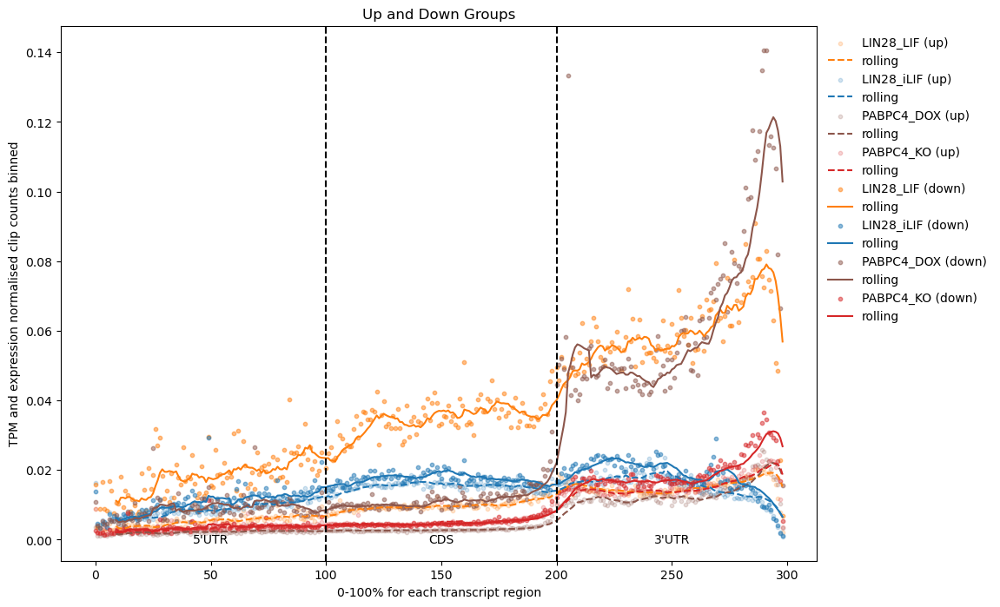

In [62]:
def split_df_into_series_dict_custom(big_df, series_name_suffix_1, series_name_suffix_2):

    series_dict = {}
    
    # Iterate through each column in the DataFrame
    for column in big_df.columns:
        # Check if the column ends with the first or second series suffix
        if column.endswith(series_name_suffix_1):
            # Extract the key by removing the suffix and the preceding underscore
            key = column[:-len(series_name_suffix_1)-1]
            if key not in series_dict:
                series_dict[key] = [None, None]
            series_dict[key][0] = big_df[column].rename(None)
        elif column.endswith(series_name_suffix_2):
            # Extract the key by removing the suffix and the preceding underscore
            key = column[:-len(series_name_suffix_2)-1]
            if key not in series_dict:
                series_dict[key] = [None, None]
            series_dict[key][1] = big_df[column].rename(None)

    return {key: tuple(value) for key, value in series_dict.items()}

result_df = pd.read_csv('analysis14_CLIPHeatmapAndMetaplot/Normalised_CLIP_counts_binned.csv')
result_dict = split_df_into_series_dict_custom(result_df, 'Normalised_CLIP_counts_binned', 'Normalised_CLIP_counts_binned_SD')

# Define the offsets
offset_dict = {'Five': 0, 'CDS': 100, 'Three': 200}
separator_lines = [100, 200]

#include_clip_info = ['LIN28_iLIF', 'LIN28_LIF', 'PABPC4_DOX', 'PABPC4_KO', 'PABPC1_DOX', 'PABPC1_KO']
include_clip_info = ['LIN28_iLIF', 'LIN28_LIF', 'PABPC4_DOX', 'PABPC4_KO']


# Preprocess the dataframes into a single large dataframe suitable for seaborn
dataframes = []
for key, value in result_dict.items():
    df = pd.DataFrame(value[0]) 
    df = df.reset_index().rename(columns={'index': 'x'})  # Reset the index and rename the new column to 'x'
    key_parts = key.split('_')
    section = key_parts[0]  # Extract the section ('5_prime', 'CDS', '3_prime') from the key
    df['x'] += offset_dict[section]  # Offset the x-coordinates
    df['bed_clip'] = key  # Add column indicating the combination
    df['clip_info'] = '_'.join(key_parts[-2:])  # Extract the clip data info from the key
    df['group'] = key_parts[-5]
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    dataframes.append(df)

# Concatenate all dataframes into one
plot_data_df = pd.concat(dataframes)

plot_data_df.sort_values('x', inplace=True)

# Create a color palette for the unique clip_info labels
# Define your colors (as many as you need)
#colors = ['orange', 'red', 'green', 'purple', 'yellow', 'blue']
colors = ["#ff7f0e", "#1f77b4",  "#2ca02c", "#d62728", "#9467bd", "#8c564b"]

# Create a dictionary with unique 'clip_info' values and corresponding colors
palette = dict(zip(plot_data_df['clip_info'].unique(), colors))
# Create a single figure (not two subplots)
fig, ax = plt.subplots(figsize=(12, 8))

# Line styles for 'up' and 'down' groups
line_styles = {'up': '--', 'down': '-'}

# Alpha levels for 'up' and 'down' groups
alpha_levels = {'up': 0.2, 'down': 0.5}

# Darker color palette for 'down' group
darker_colors = ["#cc5500", "#174a7c",  "#1c7022", "#9b1b14", "#673697", "#663300"]
dark_palette = dict(zip(plot_data_df[plot_data_df['group'] == 'down']['clip_info'].unique(), darker_colors))
print(palette)
print(dark_palette)
# Process each group separately, but plot in the same axes
for group, linestyle in line_styles.items():
    group_df = plot_data_df[plot_data_df['group'] == group]
    group_df = group_df[group_df['clip_info'].isin(include_clip_info)]
    
    for clip_info, clip_group_df in group_df.groupby('clip_info'):
        clip_group_df = clip_group_df.sort_values('x')  # Ensure data is sorted by 'x'
        clip_group_df['rolling'] = clip_group_df[0].rolling(window=10).mean()
        
        if group == 'down':
            clip_group_df.plot.scatter(x='x', y=0, ax=ax, label=f'{clip_info} ({group})', color=palette[clip_info], s=10, alpha=alpha_levels[group])
            clip_group_df.plot(x='x', y='rolling', ax=ax, color=palette[clip_info], linestyle=linestyle)
        else:
            clip_group_df.plot.scatter(x='x', y=0, ax=ax, label=f'{clip_info} ({group})', color=palette[clip_info], s=10, alpha=alpha_levels[group])
            clip_group_df.plot(x='x', y='rolling', ax=ax, color=palette[clip_info], linestyle=linestyle)
        
for line in separator_lines:
    ax.axvline(x=line, color='k', linestyle='--')  # Add vertical line

ax.set_title('Up and Down Groups')
ax.set_ylabel('TPM and expression normalised clip counts binned')

# Add text inside the plot at custom location
ax.text(50, 0, "5'UTR", fontsize=10, ha='center', va='center')
ax.text(150, 0, "CDS", fontsize=10, ha='center', va='center')
ax.text(250, 0, "3'UTR", fontsize=10, ha='center', va='center')

# Move the legend outside of the plot
ax.legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=False)

# Adjust the subplot parameters so there is space for the legend.
plt.subplots_adjust(right=0.85)

# set y limit if needed
#ax.set_ylim(0, 0.175)

ax.set_xlabel('0-100% for each transcript region')

plt.show()

{'LIN28_iLIF': '#1f77b4', 'LIN28_LIF': '#ff7f0e', 'PABPC1_DOX': '#2ca02c', 'PABPC4_KO': '#d62728', 'PABPC1_KO': '#9467bd', 'PABPC4_DOX': '#8c564b'}


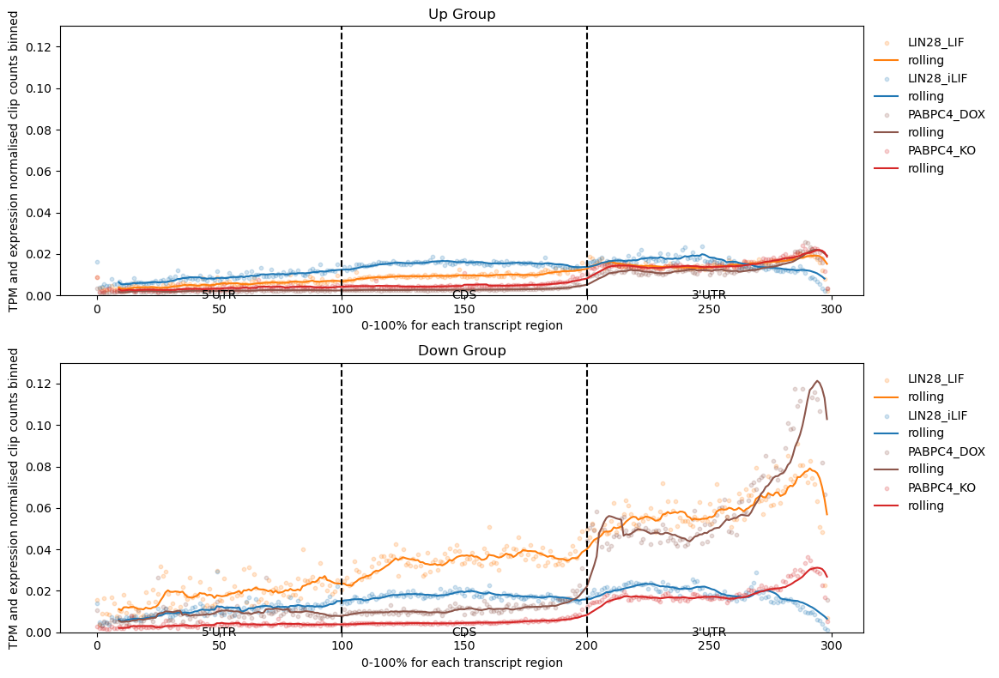

In [6]:
def split_df_into_series_dict_custom(big_df, series_name_suffix_1, series_name_suffix_2):

    series_dict = {}
    
    # Iterate through each column in the DataFrame
    for column in big_df.columns:
        # Check if the column ends with the first or second series suffix
        if column.endswith(series_name_suffix_1):
            # Extract the key by removing the suffix and the preceding underscore
            key = column[:-len(series_name_suffix_1)-1]
            if key not in series_dict:
                series_dict[key] = [None, None]
            series_dict[key][0] = big_df[column].rename(None)
        elif column.endswith(series_name_suffix_2):
            # Extract the key by removing the suffix and the preceding underscore
            key = column[:-len(series_name_suffix_2)-1]
            if key not in series_dict:
                series_dict[key] = [None, None]
            series_dict[key][1] = big_df[column].rename(None)

    return {key: tuple(value) for key, value in series_dict.items()}

result_df = pd.read_csv('analysis14_CLIPHeatmapAndMetaplot/Normalised_CLIP_counts_binned.csv')
result_dict = split_df_into_series_dict_custom(result_df, 'Normalised_CLIP_counts_binned', 'Normalised_CLIP_counts_binned_SD')

# Define the offsets
offset_dict = {'Five': 0, 'CDS': 100, 'Three': 200}
separator_lines = [100, 200]
include_clip_info = ['LIN28_iLIF', 'LIN28_LIF', 'PABPC4_DOX', 'PABPC4_KO']


# Preprocess the dataframes into a single large dataframe suitable for seaborn
dataframes = []
for key, value in result_dict.items():
    df = pd.DataFrame(value[0])  # Assuming 'value' is a dataframe
    df = df.reset_index().rename(columns={'index': 'x'})  # Reset the index and rename the new column to 'x'
    key_parts = key.split('_')
    section = key_parts[0]  # Extract the section ('5_prime', 'CDS', '3_prime') from the key
    df['x'] += offset_dict[section]  # Offset the x-coordinates
    df['bed_clip'] = key  # Add column indicating the combination
    df['clip_info'] = '_'.join(key_parts[-2:])  # Extract the clip data info from the key
    df['group'] = key_parts[-5]
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    dataframes.append(df)

# Concatenate all dataframes into one
plot_data_df = pd.concat(dataframes)

plot_data_df.sort_values('x', inplace=True)

# Create a figure with two subplots (up and down)
fig, ax = plt.subplots(2, 1, figsize=(12, 8))

# Create a color palette for the unique clip_info labels
# Define your colors (as many as you need)
#colors = ['orange', 'red', 'green', 'purple', 'yellow', 'blue']
colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]

# Create a dictionary with unique 'clip_info' values and corresponding colors
palette = dict(zip(plot_data_df['clip_info'].unique(), colors))
print(palette)

# Calculate rolling averages and plot for 'up' group
up_df = plot_data_df[plot_data_df['group'] == 'up']
up_df = up_df[up_df['clip_info'].isin(include_clip_info)]

for clip_info, group_df in up_df.groupby('clip_info'):
    group_df = group_df.sort_values('x')  # Ensure data is sorted by 'x'
    group_df['rolling'] = group_df[0].rolling(window=10).mean()
    group_df.plot.scatter(x='x', y=0, ax=ax[0], label=clip_info, color=palette[clip_info], s=10, alpha=0.2)
    group_df.plot(x='x', y='rolling', ax=ax[0], color=palette[clip_info])
for line in separator_lines:
    ax[0].axvline(x=line, color='k', linestyle='--')  # Add vertical line
ax[0].set_title('Up Group')
ax[0].set_ylabel('TPM and expression normalised clip counts binned')

# Calculate rolling averages and plot for 'down' group
down_df = plot_data_df[plot_data_df['group'] == 'down']
down_df = down_df[down_df['clip_info'].isin(include_clip_info)]

for clip_info, group_df in down_df.groupby('clip_info'):
    group_df = group_df.sort_values('x')  # Ensure data is sorted by 'x'
    group_df['rolling'] = group_df[0].rolling(window=10).mean()
    group_df.plot.scatter(x='x', y=0, ax=ax[1], label=clip_info, color=palette[clip_info], s=10, alpha=0.2)
    group_df.plot(x='x', y='rolling', ax=ax[1], color=palette[clip_info])
for line in separator_lines:
    ax[1].axvline(x=line, color='k', linestyle='--')  # Add vertical line
ax[1].set_title('Down Group')
ax[1].set_ylabel('TPM and expression normalised clip counts binned')

# Show the plot
plt.tight_layout()

# Add text inside the plot at custom location
ax[0].text(50, 0, "5'UTR", fontsize=10, ha='center', va='center')
ax[0].text(150, 0, "CDS", fontsize=10, ha='center', va='center')
ax[0].text(250, 0, "3'UTR", fontsize=10, ha='center', va='center')
ax[1].text(50, 0, "5'UTR", fontsize=10, ha='center', va='center' )
ax[1].text(150, 0, "CDS", fontsize=10, ha='center', va='center')
ax[1].text(250, 0, "3'UTR", fontsize=10, ha='center', va='center')

# Move the legend outside of the plot
ax[0].legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=False)
ax[1].legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=False)

# Adjust the subplot parameters so there is space for the legend.
plt.subplots_adjust(right=0.85)

# set y limit
ax[0].set_ylim(0, 0.13)
ax[1].set_ylim(0, 0.13)

ax[0].set_xlabel('0-100% for each transcript region')
ax[1].set_xlabel('0-100% for each transcript region')

plt.show()